# Project 3 - Waves and Fourier Analysis

### <p style="text-align: right;">  Kyle Taft

## Background:

The Fourier transform is an exceptional mathematical tool that is useful is many fields of physics. It is used to transform a function from the time domain to the frequency domain. In my project I decided to use it in a more complicated way than we have seen in class. I used it change between position and momentum space for a quantum mechanical wave function. In this notebook I show its importance in being able to numerically solve the Schrodinger equation for a particle in an infinite potenial well with a barrier in the middle by use of FFTs. I produce animations to help visualize the physics of the problem.

**Note:** This project stands as a proof of concept and many unphysical short cuts were taken for sake of time. A lot of constant are incorrect and the wave function is not always normalized. I used the units that made the animation look the best.

I took motivation from the following project: https://jakevdp.github.io/blog/2012/09/05/quantum-python/

## Physics Motivation:

In order to build the mathematic basis of the quantum mechanics and therefore the usefulness of the Fourier transform in this problem I will be walking through equations pulled directly out of McIntyre's Quantum Mechanics textbook.

The fundamental relations that we rely on to make this calculation are equation 6.30 and 6.31 from McIntyre. They are as follows:

$$\psi(x) = \frac{1}{\sqrt{2\pi\hbar}} \int_{-\infty}^{\infty} \phi(p) e^{\frac{ipx}{\hbar}} dp = Fourier(\phi(p))$$

$$\phi(p) = \frac{1}{\sqrt{2\pi\hbar}} \int_{-\infty}^{\infty} \psi(x) e^{\frac{ipx}{\hbar}} dx = invFourier(\psi(x))$$

Where $\psi(x)$ is the wave function in position space, $\phi(p)$ is the wave function in momentum space. We are able to figure out one if we know the other through the use of Fourier transforms. We will see how this allows us to do our calculations in our code.

## Defining our inital wave function:

In [179]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import animation
from scipy.fftpack import fft, ifft

# Taken directly from https://jakevdp.github.io/blog/2012/09/05/quantum-python/
def gauss_x(x, a, x0, k0):
    """
    a gaussian wave packet of width a, centered at x0, with momentum k0
    """ 
    return ((a * np.sqrt(np.pi)) ** (-0.5) * np.exp(-0.5 * ((x - x0) * 1. / a) ** 2 + 1j * x * k0))

Here we generate an example position wave packet that it centered at 0. We can see its shape in the position space in the first plot with its imagniary part. By taking the magnitude squared of the wave packet we can get the probability density of the position.  

c:\Users\2003k\anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


The probability adds up to:  0.9999999999984615


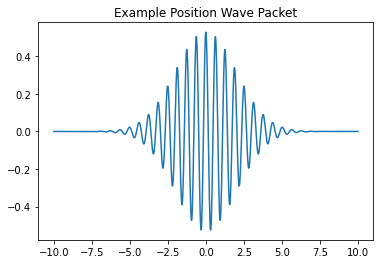

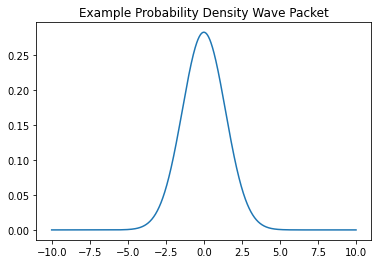

In [180]:
# An example of the wave packet
x = np.linspace(-10, 10, 1000)
psi = gauss_x(x, 2, 0.0, 10.0)
plt.figure()
plt.plot(x, psi);
plt.title("Example Position Wave Packet")

# The squared magnitude of the wave packet is the probability density
plt.figure()
plt.plot(x, np.abs(psi)**2);
plt.title("Example Probability Density Wave Packet");

#We can see that the probability adds up to 1
print("The probability adds up to: ", np.trapz(np.abs(psi)**2, x = x))

The probability adds up to:  0.9999999999999999


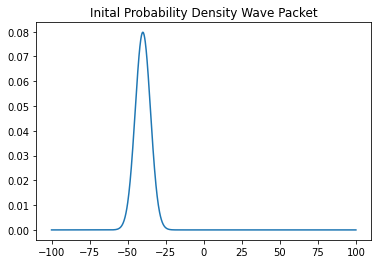

In [181]:
#Constants
hbar = 1   # planck's constant/2pi (set to 1 for simplicity)
m = 1      # particle's mass (set to 1 for simplicity)

#Position range
x = np.linspace(-100,100,1024)
x0 = -40 #Initial position
p0 = 1 #Initial momentum


# using recommened values from the project
p0 = np.sqrt(2 * m * 0.2 * 2)
dp2 = p0 * p0 * 1./80
d = hbar / np.sqrt(2 * dp2)


# Get the wave packet
#position_wave = gauss_x(x, 5, x0, p0 / hbar)
position_wave = gauss_x(x, d, x0, p0 / hbar)

# The squared magnitude of the wave packet is the probability density
plt.figure()
plt.plot(x, np.abs(position_wave)**2);
plt.title("Inital Probability Density Wave Packet");

#We can see that the probability adds up to 1
print("The probability adds up to: ", np.trapz(np.abs(position_wave)**2, x = x))

## Defining the potential well:

Here we define the potential well that we will be using for our calculations. We will be using a potential well that is infinite on the left and right side and has a barrier in the middle. Here it is graphed:

Text(0, 0.5, 'Potential Energy')

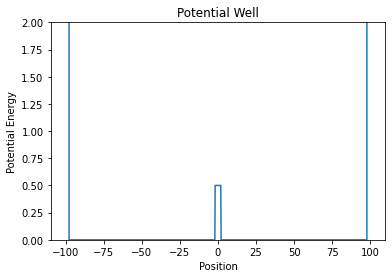

In [182]:
# Set up the potential
V_x = np.zeros(x.shape)
V_x[x < -98] = 1E6 #Infinite wall
V_x[x > 98] = 1E6
V_x[(x > -2) & (x < 2)] = 0.5 #Barrier of 0.5

plt.plot(x,V_x)
plt.ylim(0,2)
plt.title("Potential Well")
plt.xlabel("Position")
plt.ylabel("Potential Energy")

## Evolving the wave function in time:

Here is the real meat of the project. We will be using the Fourier transform to evolve the wave function in time using the "split-operator" method. The focus is in the function `evolve` defined below. The function takes in the wave function in position space and evolves it in time. It does this by first taking the Fourier transform of the wave function in position space to get the wave function in momentum space. Then it multiplies the wave function in momentum space by the kinetic energy operator in momentum space. Then it takes the inverse Fourier transform of the wave function in momentum space to get the wave function in position space. Then it multiplies the wave function in position space by the potential energy operator in position space. Then it multiplies the wave function in position space by the time evolution operator. Then it repeats the process for the next time step using the new wave function in position space. 

In [183]:
N  = len(x)
t0 = 0
dx = x[1] - x[0]
dk = 2 * np.pi / (N * dx)

k0 = -0.5 * N * dk
k = k0 + dk * np.arange(N)



def evolve(position_wave, dt):
    # Get momentum wave from position wave via FFT
    momentum_wave = fft(position_wave * np.exp(-1j * k[0] * x) * dx / np.sqrt(2 * np.pi))

    # Evolve momentum wave
    momentum_wave *= np.exp(-0.5 * 1j * hbar / m * (k * k) * dt)

    # Get evolved position wave via inverse FFT
    position_wave = ifft(momentum_wave)

    # Do a "half evolution" of the position wave
    position_wave *= np.exp(-0.5 * 1j * V_x / hbar * dt )

    # Get evolved momentum wave via another FFT
    psi_mod_k = fft(position_wave)

    # Get the position wave 
    new_position = (position_wave * np.exp(1j * k[0] * x) * np.sqrt(2 * np.pi) / dx)

    # Get the momentum wave
    new_momentum = psi_mod_k * np.exp(-1j * x[0] * dk * np.arange(N))

    return new_position, new_momentum

# Loop over the function to get the position and momentum waves at each time step
all_position_waves = []
all_momentum_waves = []
dt = 0.5
t_max = 100
t = np.arange(0, t_max, dt)
for i in range(len(t)):
    position_wave, momentum_wave = evolve(position_wave, dt)
    all_position_waves.append(position_wave)
    all_momentum_waves.append(momentum_wave)


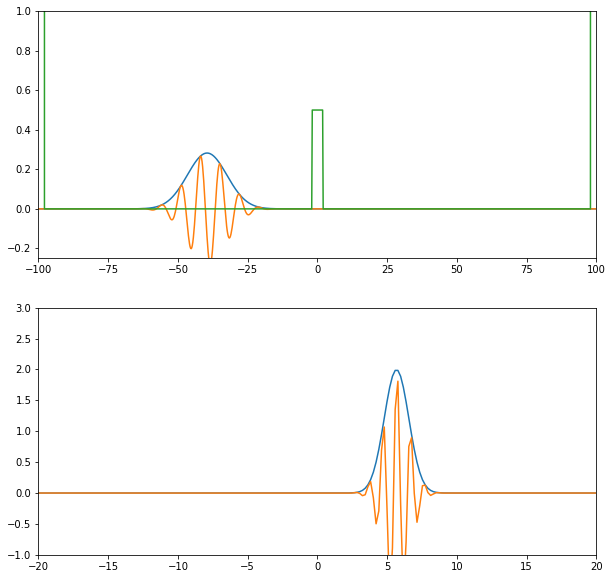

In [184]:
# Create two subplots 
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=False, figsize=(10,10))

# Plot the first frame of the animation
pos_wave, = ax1.plot(x, abs(all_position_waves[0]))
pos_packet, = ax1.plot(x, all_position_waves[0])
moment_wave, = ax2.plot(x, abs(all_momentum_waves[0]))
moment_packet, = ax2.plot(x, all_momentum_waves[0])
well, = ax1.plot(x, V_x)

ax1.set_xlim(-100,100)
ax1.set_ylim(-0.25,1)

ax2.set_xlim(-20,20)
ax2.set_ylim(-1,3)

# Animates the plot
def update(frame):
    pos_wave.set_ydata(abs(all_position_waves[frame]))
    moment_wave.set_ydata(abs(all_momentum_waves[frame]))
    pos_packet.set_ydata(all_position_waves[frame])
    moment_packet.set_ydata(all_momentum_waves[frame])
    
ani = animation.FuncAnimation(fig, update, frames=len(all_position_waves), interval=10, blit=False)
plt.show()

In [185]:
from IPython.display import HTML
HTML(ani.to_jshtml())

c:\Users\2003k\anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


In [186]:
# # Save as gif
# ani.save('project3.gif', writer='imagemagick', fps=10)

MovieWriter imagemagick unavailable; using Pillow instead.
c:\Users\2003k\anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


## Conclusion:

Again, there are multiple imperfections in the way that the code has been implemented and many jumps over reasoning. Yet, our focus is still clear. We see in our final result the power that the FFT can give us to analyze physical situations. We are able to see the wave function evolve in time and see the effects of the potential well on the wave function. With more time and a closer attention to the physics this technique could be used to solve many more complicated problems that are not easily solvable analytically.